# Training notebook - you will not (nor should you need to) be able to run these cells!

I attach this notebook just to show the preprocessing and training steps carried out - a separate notebook is attached that loads in the relevant weights and `torch` tensors containing test data. This is a bit messy and there are some redundant bits, but if you're interested in the training process that will be towards the bottom!

In [1]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os
import numpy as np
import torch
import random
import pickle

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [2]:
def config_plot(ax):
    '''
    Function to remove axis tickers and box around figure
    '''

    ax.axis('off')

    # Remove axis spines
    for spine in ax.spines.values():
        spine.set_visible(False)

The labels are given to us in a very unwieldy format - there are 9 folders (one for each non-background class) containing a binary mask for every image. We will try to compile each of these nine labels into one tensor.

In [3]:
def read_class_labels(class_name, i, start, end):
    class_labels = []
    folder_path = "supervised/Agriculture-Vision-2021/val/labels/" + class_name
    transform = transforms.ToTensor()

    bad_prefixes = {'set!'}
    good_prefixes = {'set!'}
    num_labels = 0
    for file in os.listdir(folder_path)[start:end]:
        prefix = file.split('_')[0]

        if prefix in bad_prefixes: # if we know it'll be all zeroes
            class_labels.append(torch.zeros(512,512))

        else: # we open it because it's either an actual label or we don't know yet
            try:
                label = Image.open(os.path.join(folder_path, file))
                label = transform(label) * i
                
            except (Image.UnidentifiedImageError, OSError) as e:
                print(f"Error opening image {file}: {e}")
            if prefix in good_prefixes: # if we know it's an actual label
                class_labels.append(label)
                num_labels += 1

            else: # if it's a new prefix we haven't seen:
                max_val = torch.max(label)
                if max_val == 0:
                    bad_prefixes.add(prefix)
                else:
                    good_prefixes.add(prefix)
                    num_labels += 1
                
                class_labels.append(label)
            
    return class_labels, num_labels

In [4]:
def get_good_single_class_indices(folder_path):
    
    good_label_indices = []
    bad_prefixes = {'set!'}
    good_prefixes = {'set!'}

    transform = transforms.ToTensor()

    for i in range(len(os.listdir(folder_path))):
        file = os.listdir(folder_path)[i]
        prefix = file.split('_')[0]
        if (i % 100) == 0:
            print(i)
        if prefix in bad_prefixes: # if we know it'll be all zeroes
            continue

        elif prefix in good_prefixes: # if we know it's an actual label
            good_label_indices.append(i)
            continue
        
        else: # we open it because we don't know yet
            try:
                label = Image.open(os.path.join(folder_path, file))
                label = transform(label)
                
            except (Image.UnidentifiedImageError, OSError) as e:
                print(f"Error opening image {file}: {e}")
                
            #it's a new prefix we haven't seen, so check if it's good or bad
            max_val = torch.max(label)
            if max_val == 0:
                bad_prefixes.add(prefix)
            else:
                good_prefixes.add(prefix)
                good_label_indices.append(i)
                
            
    return good_label_indices



We can define a custom `Dataset` to look up labels, RBG and NIR channels dynamically as necessary to prevent running out of memory!

In [265]:
class SingleClassDataset(Dataset):
    def __init__(self, image_directory, label_directory, valid_indices, transform=None):
        
        self.rgb_directory = image_directory + '/rgb'
        self.nir_directory = image_directory + '/nir'
        self.label_directory = label_directory
        
        self.all_rgb_files = [file for file in os.listdir(self.rgb_directory)]
        self.all_nir_files = [file for file in os.listdir(self.nir_directory)]
        self.all_label_files = [file for file in os.listdir(label_directory)]

        self.valid_indices = valid_indices
        
        self.valid_rgb_files = [self.all_rgb_files[i] for i in self.valid_indices]
        self.valid_nir_files = [self.all_nir_files[i] for i in self.valid_indices]
        self.valid_label_files = [self.all_label_files[i] for i in self.valid_indices]
        
        self.transform = transform

    def __len__(self):
        return len(self.valid_label_files)

    def __getitem__(self, idx):
        rgb_path = os.path.join(self.rgb_directory, self.valid_rgb_files[idx])
        rgb = Image.open(rgb_path).convert('RGB')

        nir_path = os.path.join(self.nir_directory, self.valid_nir_files[idx])
        nir = Image.open(nir_path)
        
        label_path = os.path.join(self.label_directory, self.valid_label_files[idx])
        label = Image.open(label_path)

        if self.transform:
            rgb = self.transform(rgb)
            nir = self.transform(nir)
            label = self.transform(label)

        image = torch.cat((rgb, nir), dim=0)
        
        return image, label

In [266]:
water_indices = get_good_single_class_indices("supervised/Agriculture-Vision-2021/val/labels/water")

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
17100
17200
17300
17400
17500
17600
17700
17800
17900
18000
18100
18200
18300


In [241]:
nutrient_deficiency_indices = get_good_single_class_indices("supervised/Agriculture-Vision-2021/val/labels/nutrient_deficiency")

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
17100
17200
17300
17400
17500
17600
17700
17800
17900
18000
18100
18200
18300


In [267]:
with open('water_indices.pkl', 'wb') as file:
    pickle.dump(water_indices, file)

In [242]:
with open('nutrient_indices.pkl', 'wb') as file:
    pickle.dump(nutrient_deficiency_indices, file)

In [17]:
import torch.nn as nn

class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, out_channels, kernel_size=3, padding=1),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
        )

    def forward(self, x):
        x1 = self.encoder(x)
        x2 = self.decoder(x1)
        return x2


# Single Class Testing

First, create a `Dataset` for a single class. We will also add NIR images as another channel.

In [45]:
class SingleClassDataset(Dataset):
    def __init__(self, image_directory, label_directory, valid_indices, transform=None, save_data=False):
        
        self.rgb_directory = image_directory + '/rgb'
        self.nir_directory = image_directory + '/nir'
        self.label_directory = label_directory
        
        self.all_rgb_files = [file for file in os.listdir(self.rgb_directory)]
        self.all_nir_files = [file for file in os.listdir(self.nir_directory)]
        self.all_label_files = [file for file in os.listdir(label_directory)]

        self.valid_indices = valid_indices
        
        self.valid_rgb_files = [self.all_rgb_files[i] for i in self.valid_indices]
        self.valid_nir_files = [self.all_nir_files[i] for i in self.valid_indices]
        self.valid_label_files = [self.all_label_files[i] for i in self.valid_indices]
        
        self.transform = transform
        self.save_data = save_data

    def __len__(self):
        return len(self.valid_label_files)

    def __getitem__(self, idx):
        rgb_path = os.path.join(self.rgb_directory, self.valid_rgb_files[idx])
        rgb = Image.open(rgb_path).convert('RGB')

        nir_path = os.path.join(self.nir_directory, self.valid_nir_files[idx])
        nir = Image.open(nir_path)
        
        label_path = os.path.join(self.label_directory, self.valid_label_files[idx])
        label = Image.open(label_path)

        if self.save_data:
            if (idx % 3) == 0:
                rgb.save(f'./ml_test_rgbs/{idx}.png')
                nir.save(f'./ml_test_nirs/{idx}.png')
                label.save(f'./ml_test_labels/{idx}.png')
            else:
                pass

        if self.transform:
            rgb = self.transform(rgb)
            nir = self.transform(nir)
            label = self.transform(label)

        image = torch.cat((rgb, nir), dim=0)

    
        return image, label

Shuffle the data and split for training and testing:

In [9]:
with open('water_indices.pkl', 'rb') as file:
    water_indices = pickle.load(file)

random.seed(637)
random.shuffle(water_indices)
split_index = int(0.8* len(water_indices))

In [13]:
train_water_dataset = SingleClassDataset(image_directory="supervised/Agriculture-Vision-2021/val/images/",
                                           label_directory="supervised/Agriculture-Vision-2021/val/labels/water",
                                           valid_indices=water_indices[:split_index],
                                           transform=transforms.ToTensor())

In [18]:
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

in_channels = 4
out_channels = 2 # Number of classes for single-class segmentation

# Create the model, loss function, and optimizer
model = UNet(in_channels, out_channels)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Add data to loader
transform = transforms.Compose([transforms.ToTensor()])
train_loader = DataLoader(train_water_dataset, batch_size=16, shuffle=True)

# Training loop
model.to(device)
num_epochs = 1
for epoch in range(num_epochs):
    for data in train_loader:
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        inputs.requires_grad = True
        labels = labels.long()
        optimizer.zero_grad()
        outputs = model(inputs)

        loss = criterion(outputs, labels.squeeze(1)) # Remove the channel dimension from labels
        print(loss)
        loss.backward()
        optimizer.step()
        # Move data back to CPU to save GPU memory
        #inputs, labels = inputs.cpu(), labels.cpu()

    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')

    checkpt_path = './v2_nir_water_checkpoint_' + str(epoch+1) + '_epochs'

    torch.save(
        {
            'state_dict' : model.state_dict()
        },
        checkpt_path
    )


tensor(0.6971, device='cuda:0', grad_fn=<NllLoss2DBackward0>)


KeyboardInterrupt: 

# Testing

In [46]:
test_water_dataset = SingleClassDataset(image_directory="supervised/Agriculture-Vision-2021/val/images/",
                                           label_directory="supervised/Agriculture-Vision-2021/val/labels/water",
                                           valid_indices=water_indices[split_index:],
                                           transform=transforms.ToTensor(),
                                           save_data=True)

print(split_index)

846


In [249]:
test_nutrient_dataset = SingleClassDataset(image_directory="supervised/Agriculture-Vision-2021/val/images/",
                                           label_directory="supervised/Agriculture-Vision-2021/val/labels/nutrient_deficiency",
                                           valid_indices=nutrient_indices[split_index:],
                                           transform=transforms.ToTensor())

In [125]:
test_drydown_dataset = SingleClassDataset(image_directory="supervised/Agriculture-Vision-2021/val/images/",
                                           label_directory="supervised/Agriculture-Vision-2021/val/labels/drydown",
                                           valid_indices=drydown_indices[split_index:],
                                           transform=transforms.ToTensor())

In [47]:
# Testing loop

state_dict = torch.load('v2_nir_water_checkpoint_1_epochs')['state_dict']
model.load_state_dict(state_dict)

criterion = nn.CrossEntropyLoss()

model.eval()  # Set the model to evaluation mode
model.to(device)
total_test_loss = 0.0
test_loader = DataLoader(test_water_dataset, batch_size=16, shuffle=True)
with torch.no_grad():
    for data in test_loader:  
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        labels = labels.long()
        
        outputs = model(inputs)        

        test_loss = criterion(outputs, labels.squeeze(1))
        total_test_loss += test_loss.item()

# Calculate average test loss
average_test_loss = total_test_loss / len(test_loader)

print(f'Average Test Loss: {average_test_loss:.4f}')


Average Test Loss: 0.5233


In [17]:
from matplotlib.colors import ListedColormap

# Define custom colors for each class
custom_colors = ['#1f77b4', '#bcbd22', '#2ca02c', '#ff7f0e',  '#d62728', '#9467bd',
                 '#8c564b', '#e377c2', '#7f7f7f',  '#17becf']

# Create a new colormap with custom colors
custom_cmap = ListedColormap(custom_colors, name='custom_colormap')

In [18]:
def plot(tensor):
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(tensor)
    plt.show()

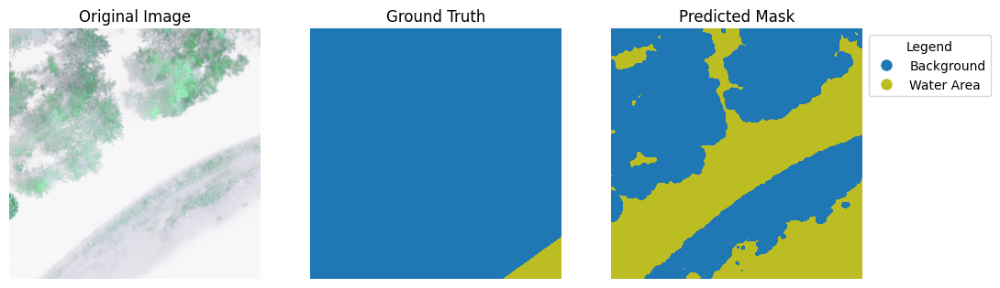

Loss: 0.43627575039863586


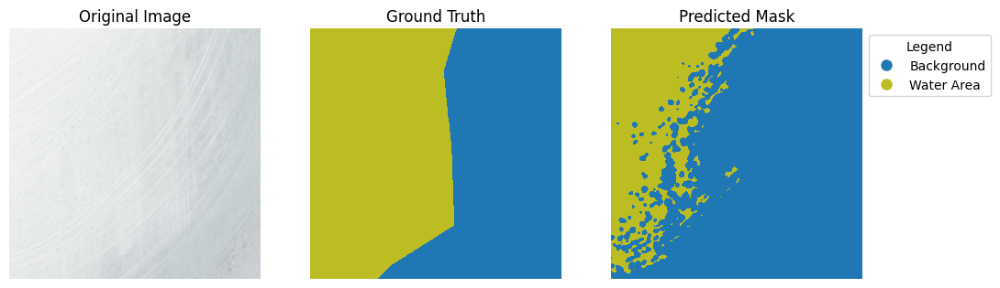

Loss: 0.4767015874385834


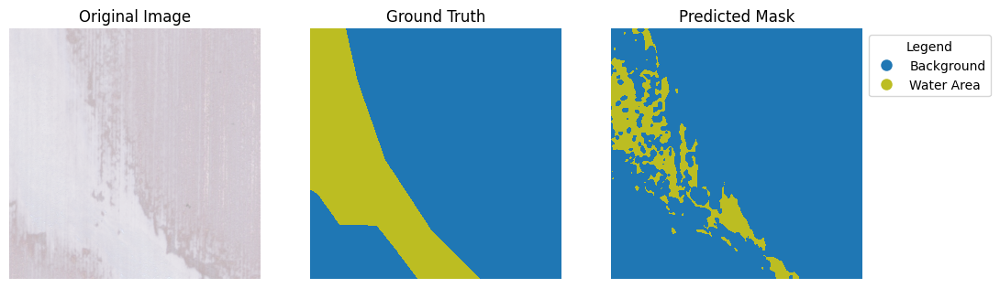

Loss: 0.30384698510169983


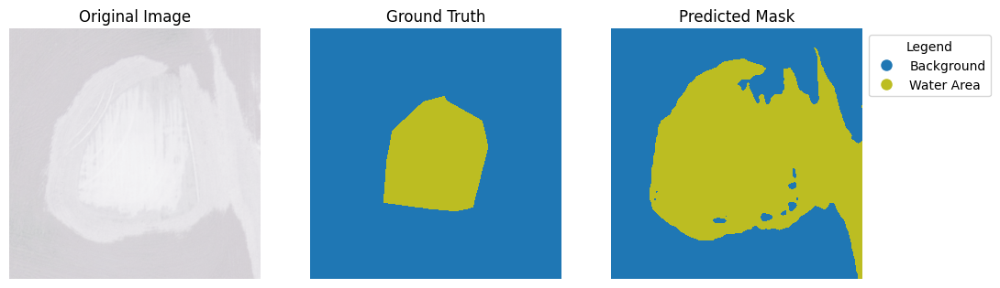

Loss: 0.3983404338359833


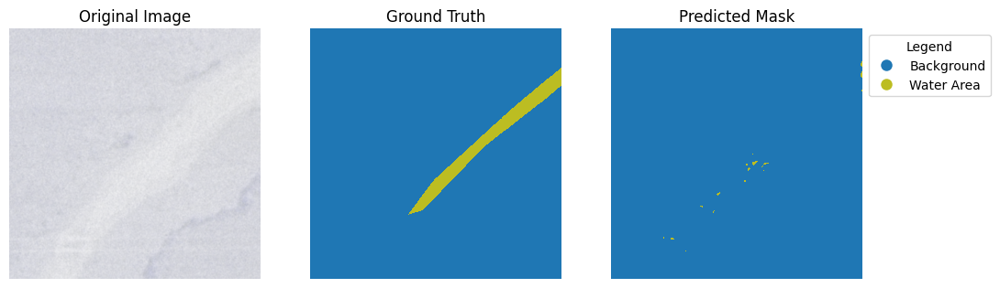

Loss: 0.4345237910747528


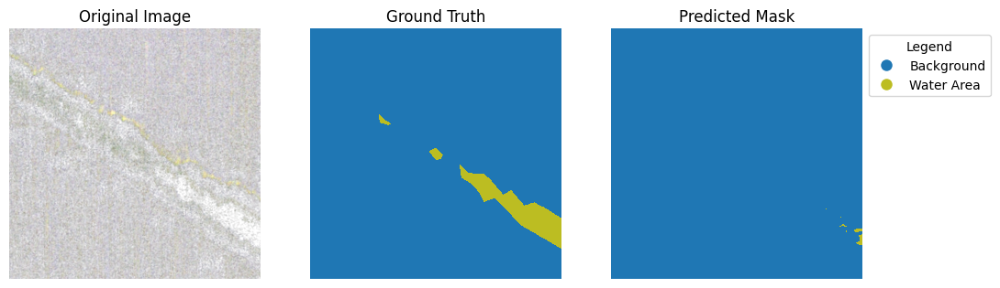

Loss: 0.10196356475353241


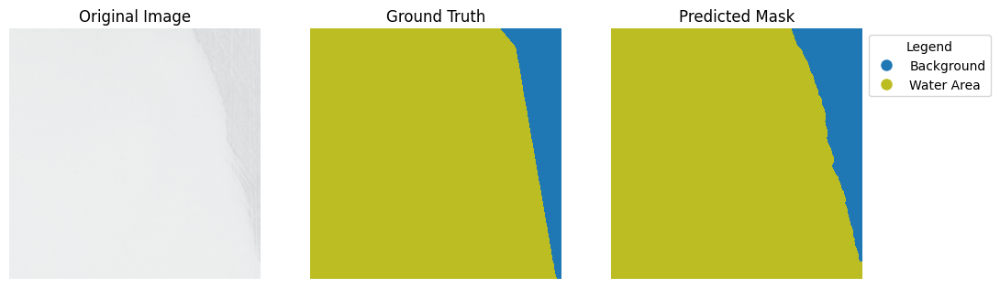

Loss: 0.614935576915741


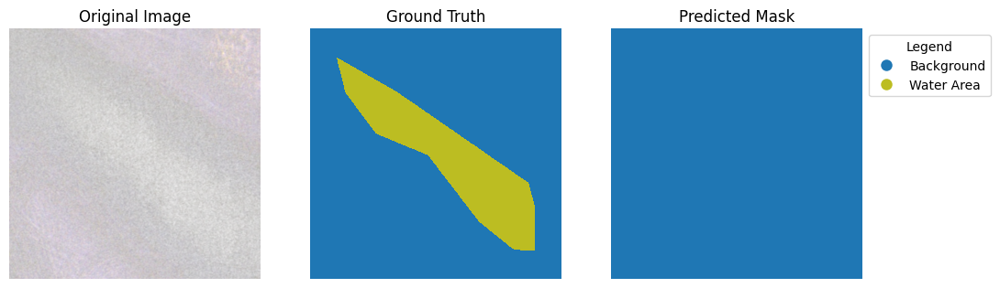

Loss: 0.3907541036605835


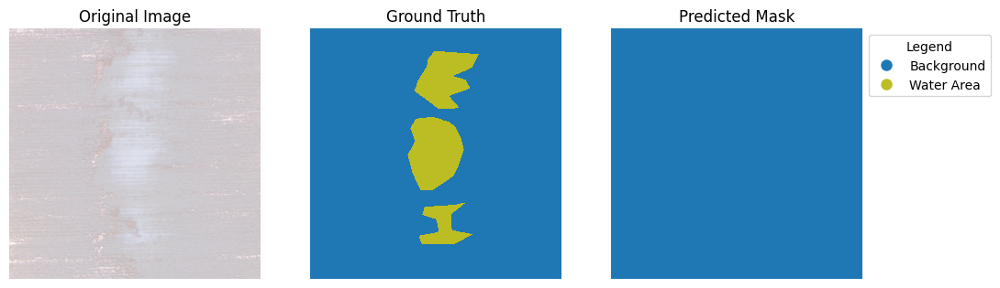

Loss: 0.2168464958667755


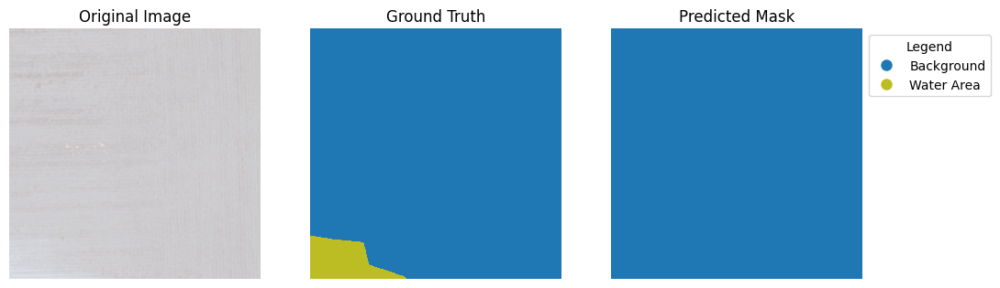

Loss: 0.1062726378440857


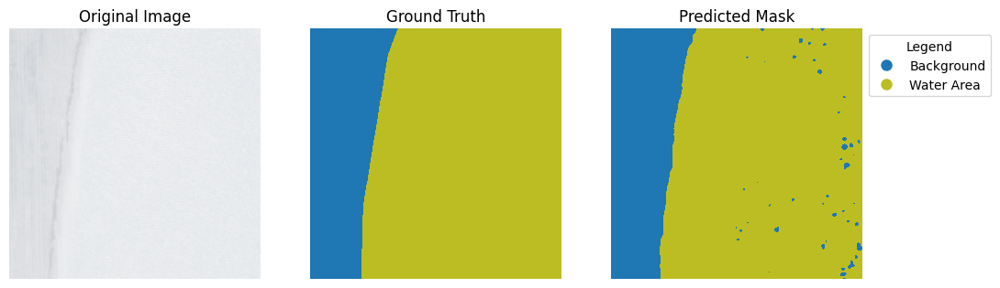

Loss: 0.6117748618125916


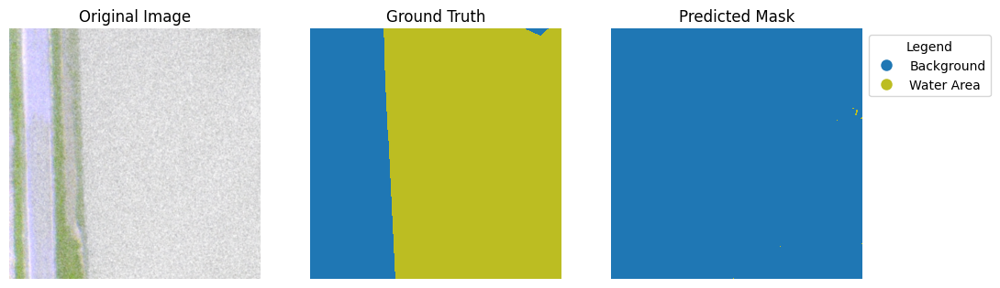

Loss: 0.7326683402061462


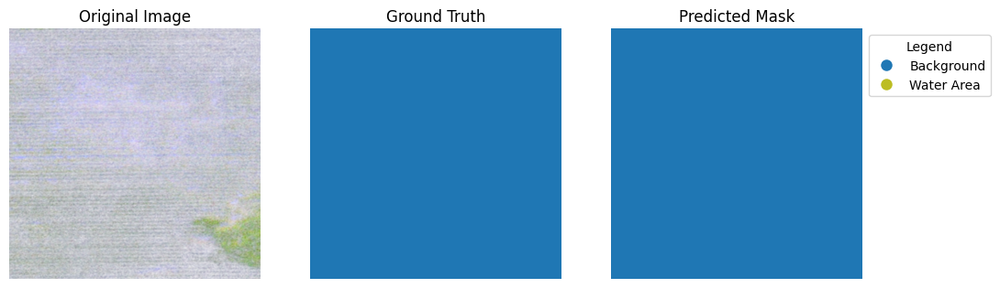

Loss: 0.011725835502147675


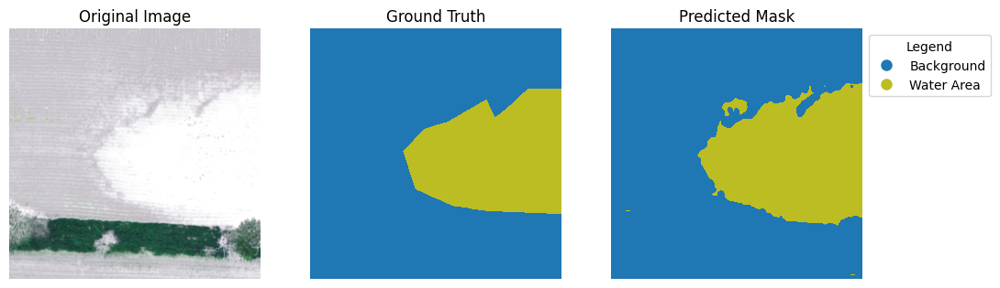

Loss: 0.20848186314105988


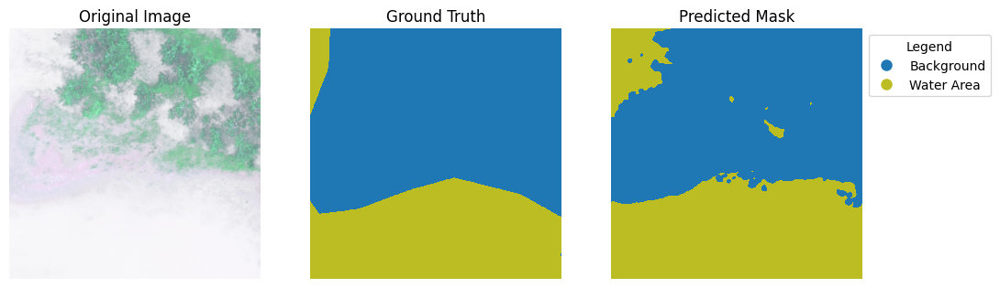

Loss: 0.3233265280723572


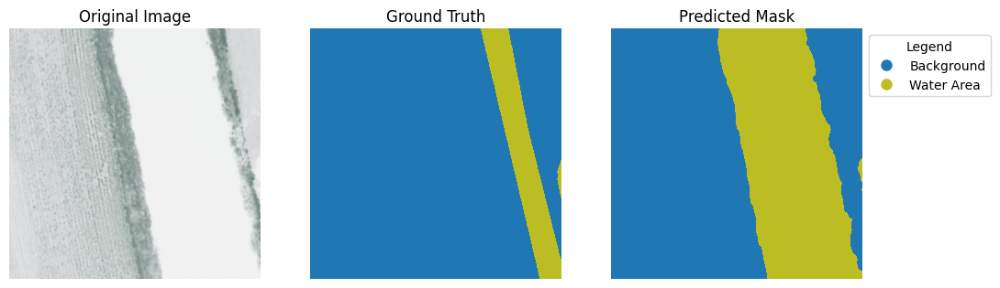

Loss: 0.3573126196861267


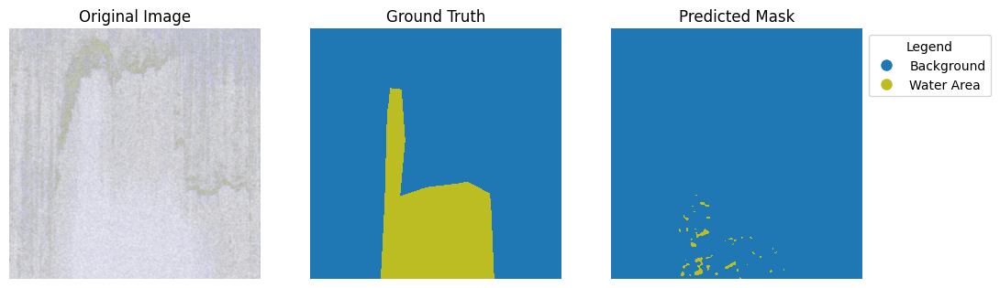

Loss: 0.24059076607227325


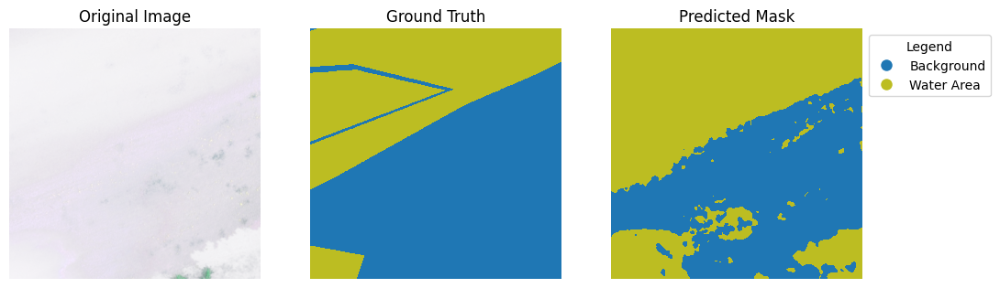

Loss: 0.6127472519874573


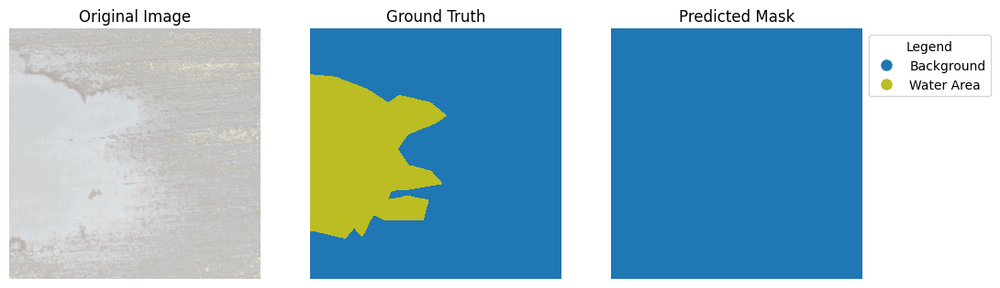

Loss: 0.5147231817245483


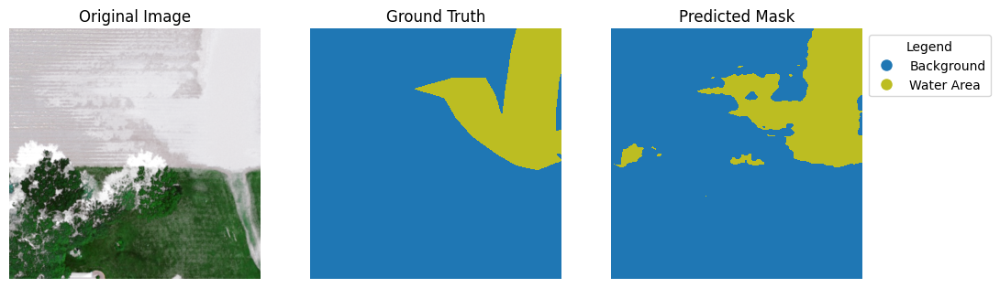

Loss: 0.19524672627449036


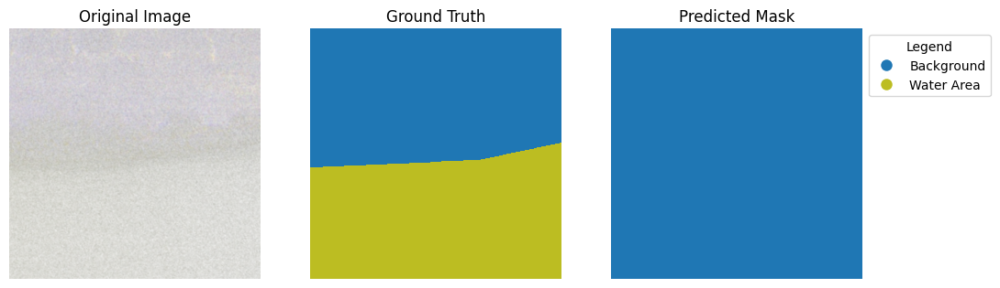

Loss: 0.9027287364006042


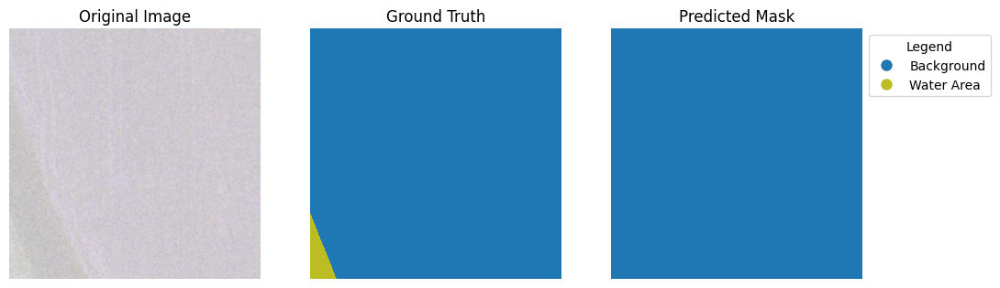

Loss: 0.0386781245470047


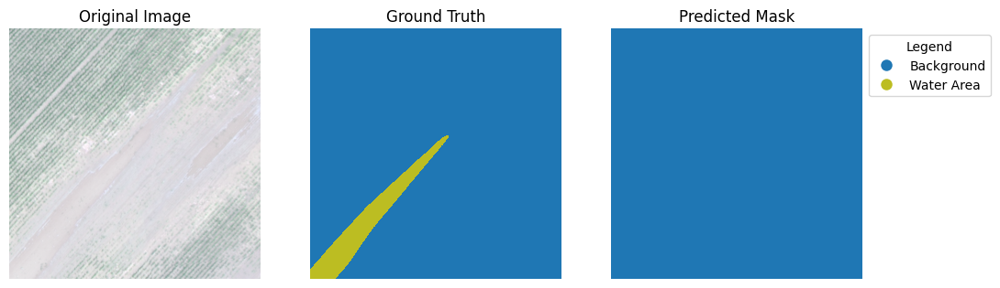

Loss: 0.07757832109928131


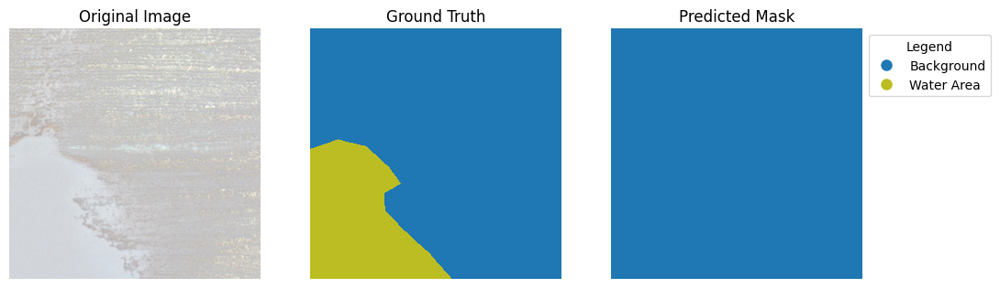

Loss: 0.6231030225753784


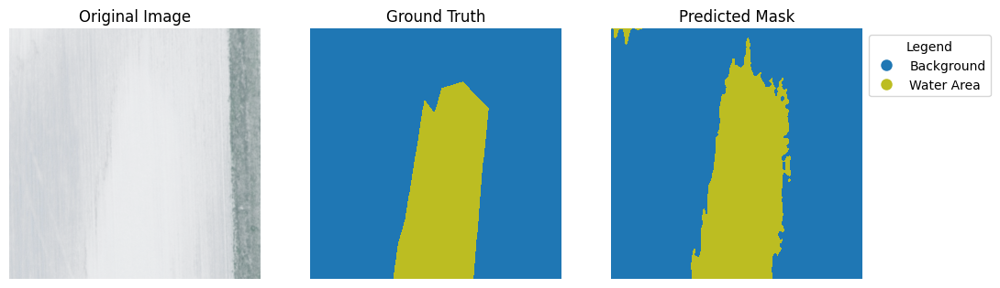

Loss: 0.45516130328178406


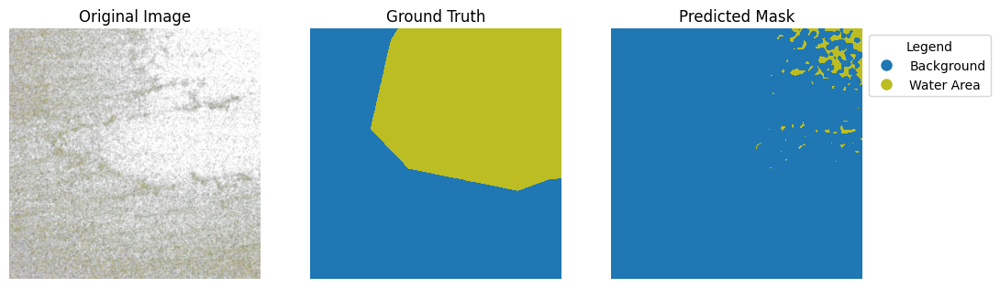

Loss: 0.711968719959259


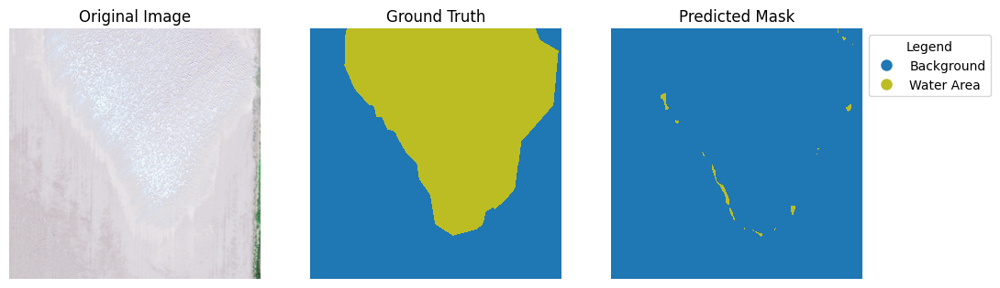

Loss: 1.4684438705444336


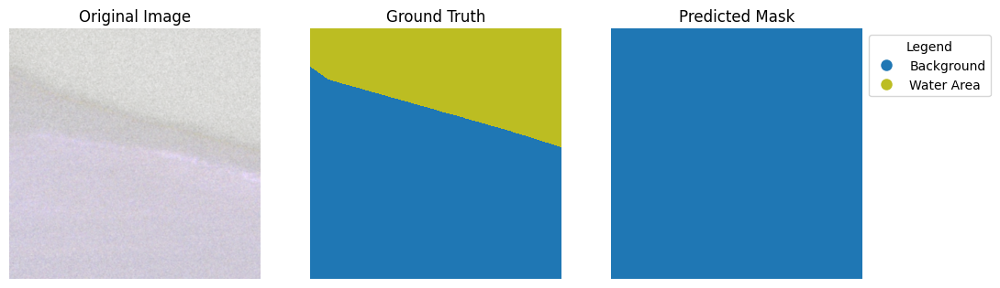

Loss: 0.5053843259811401


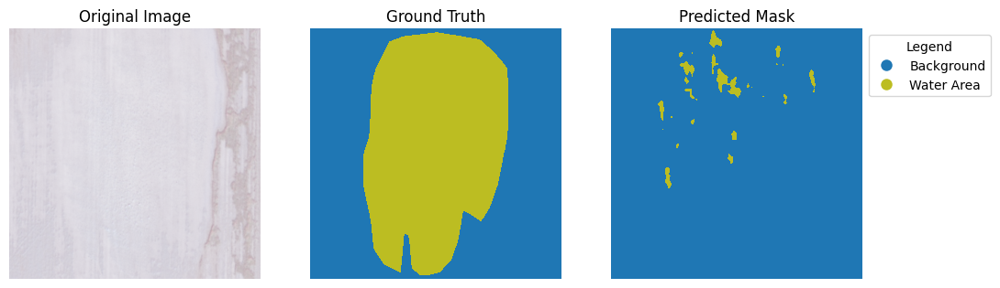

Loss: 0.542490541934967


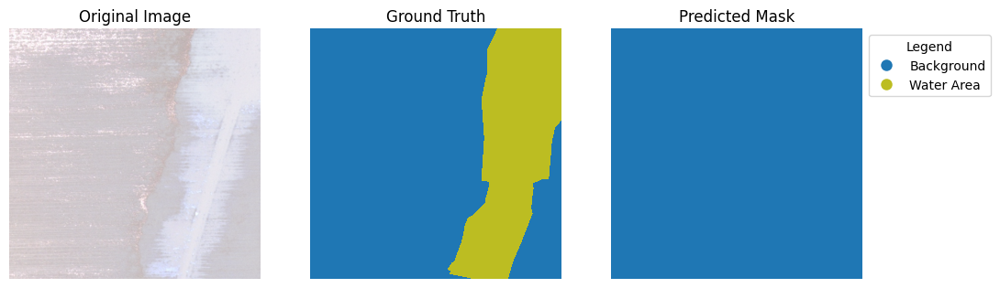

Loss: 0.7370314598083496


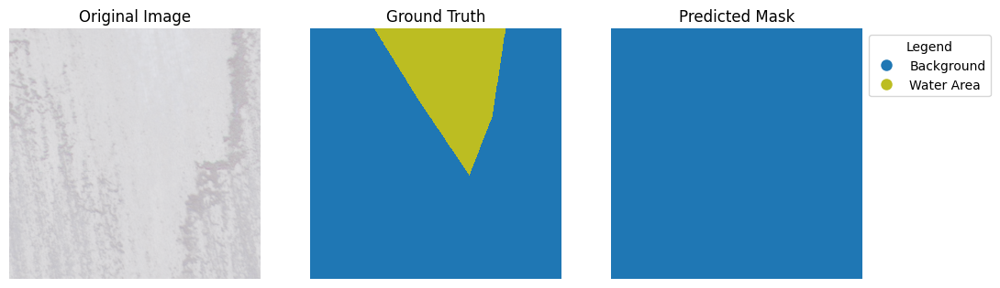

Loss: 0.35431304574012756


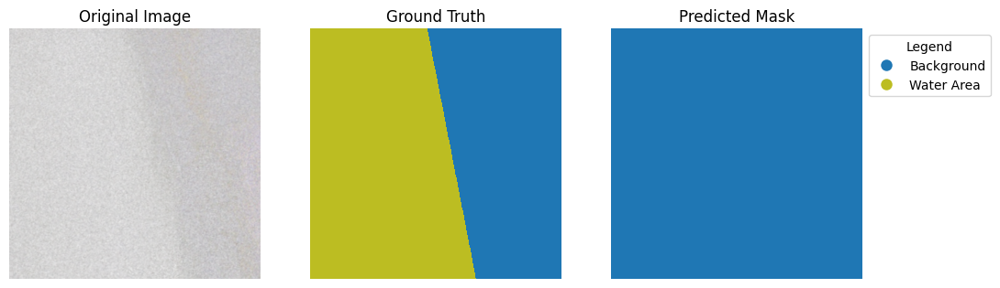

Loss: 1.0307008028030396


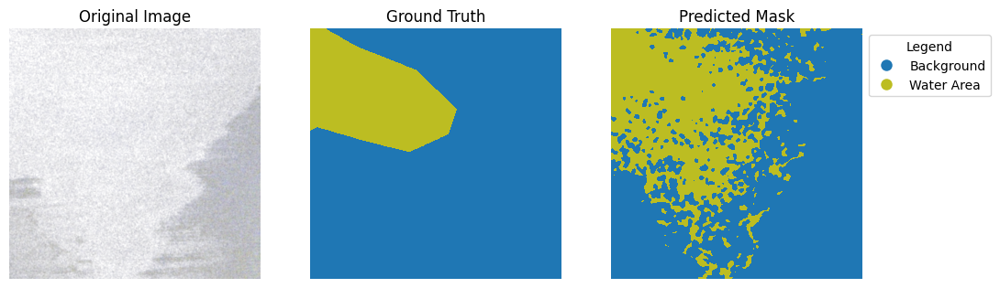

Loss: 0.49572089314460754


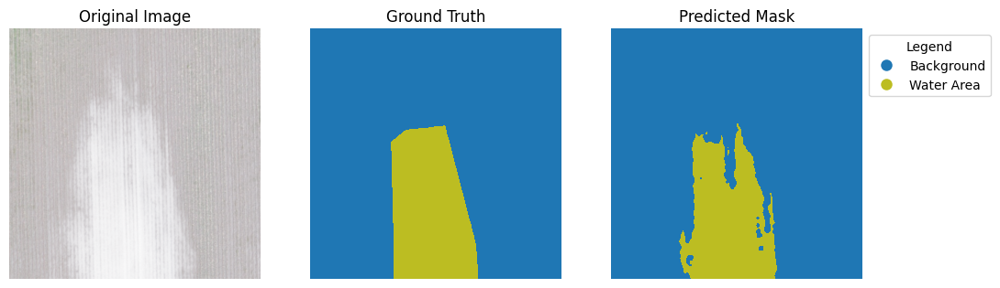

Loss: 0.15459303557872772


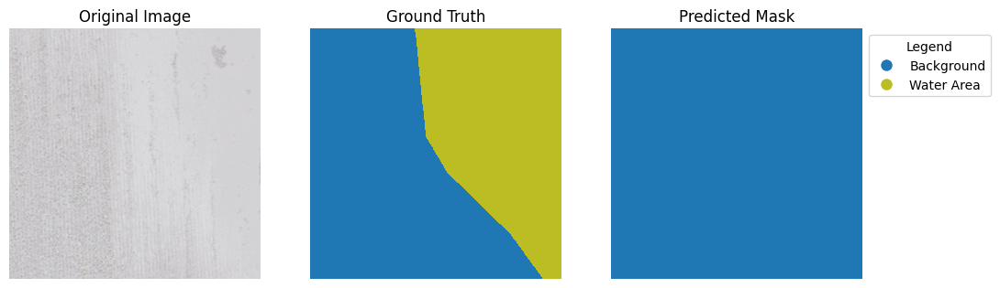

Loss: 0.7835630774497986


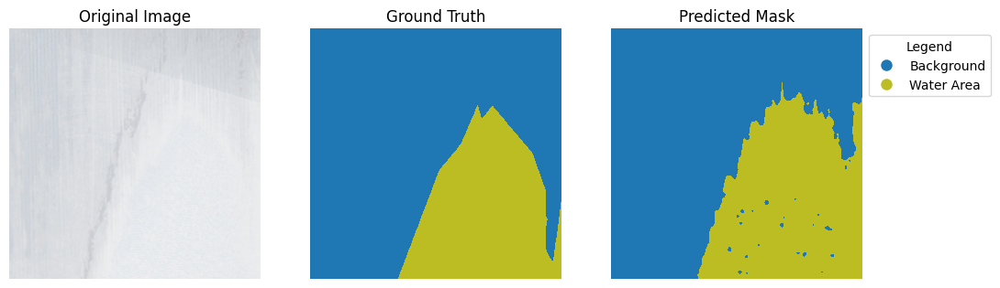

Loss: 0.4700174331665039


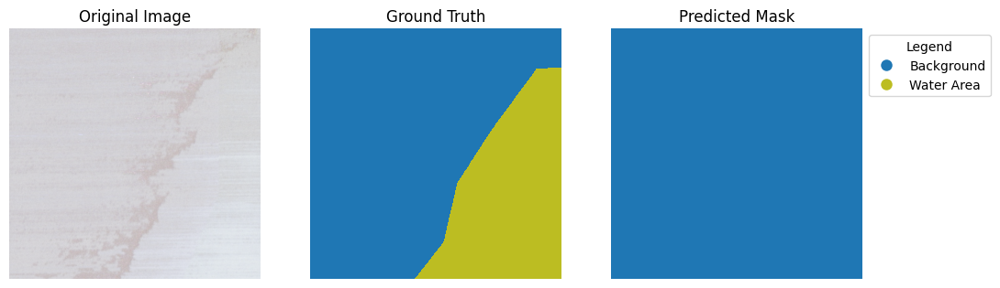

Loss: 0.4981251657009125


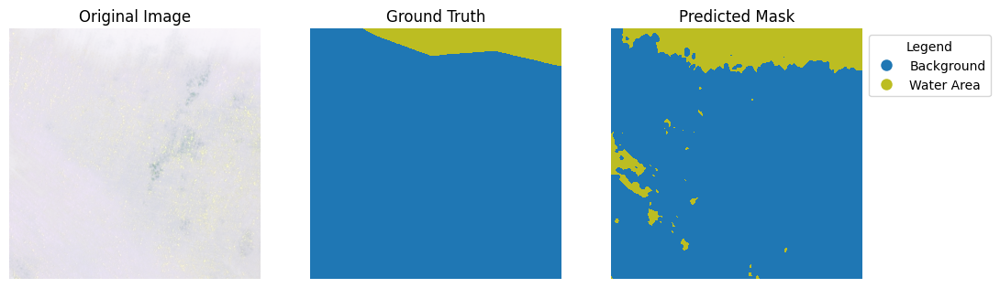

Loss: 0.48366743326187134


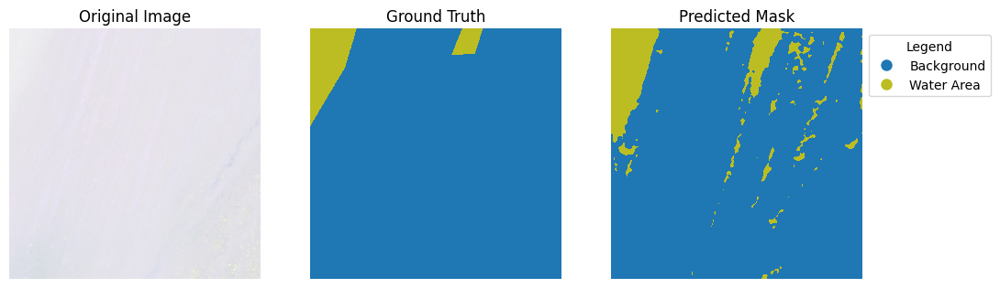

Loss: 0.6211404204368591


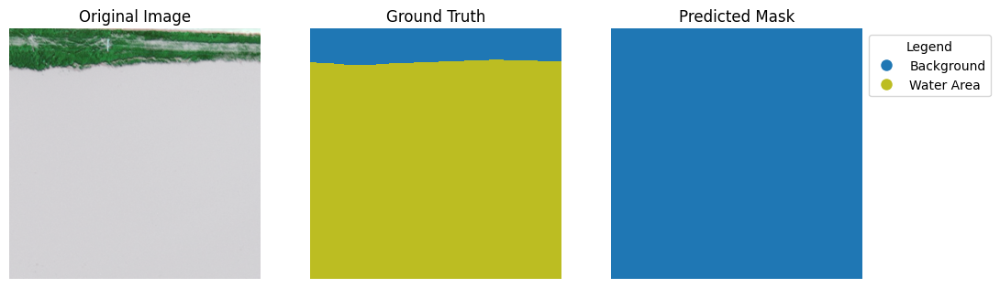

Loss: 1.9244694709777832


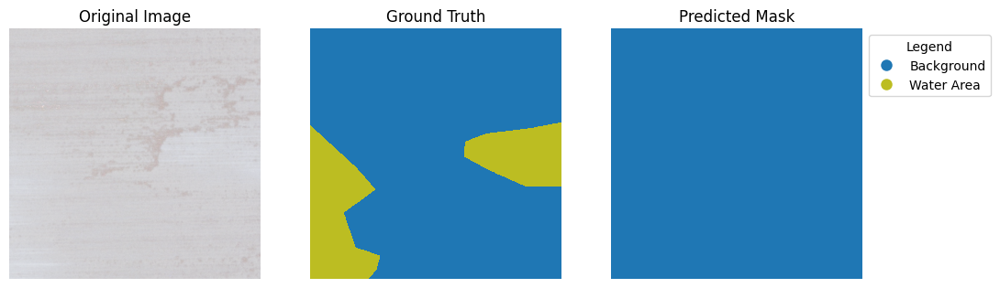

Loss: 0.361935555934906


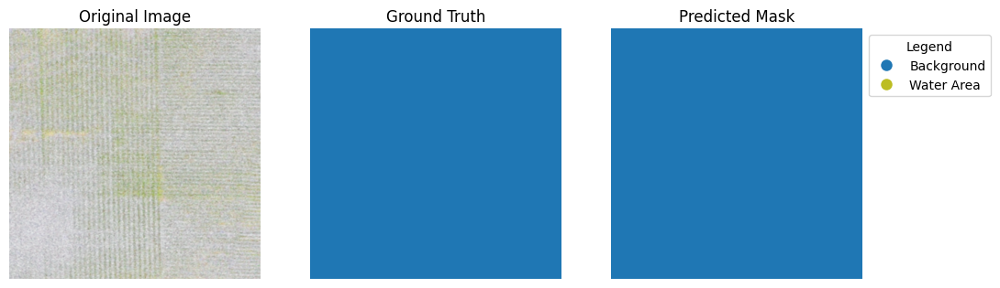

Loss: 0.011932467110455036


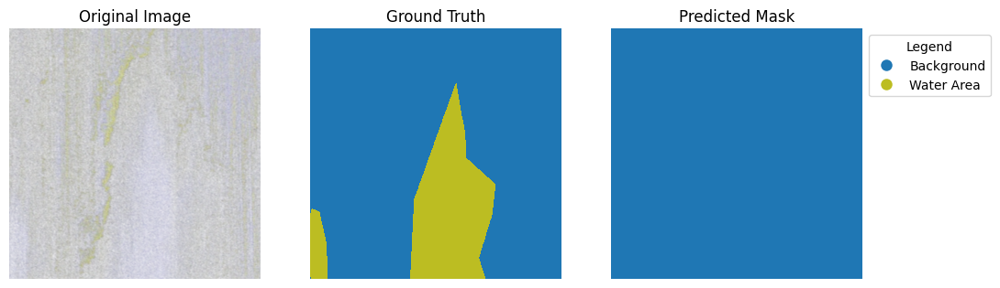

Loss: 0.3683566749095917


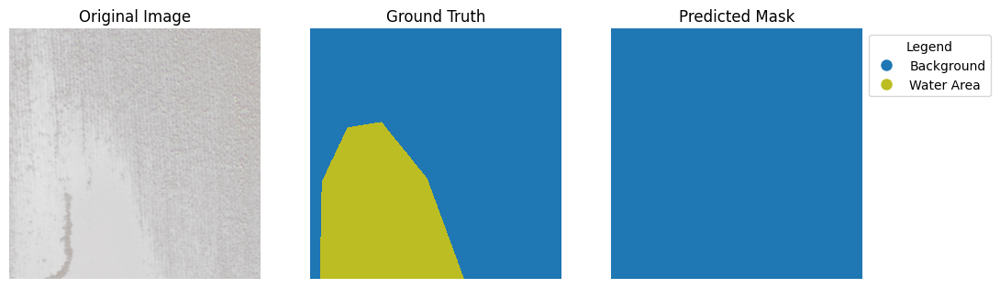

Loss: 0.4036179482936859


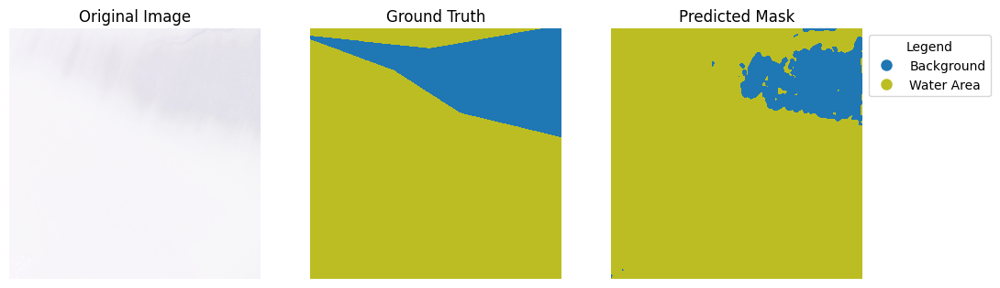

Loss: 0.5965689420700073


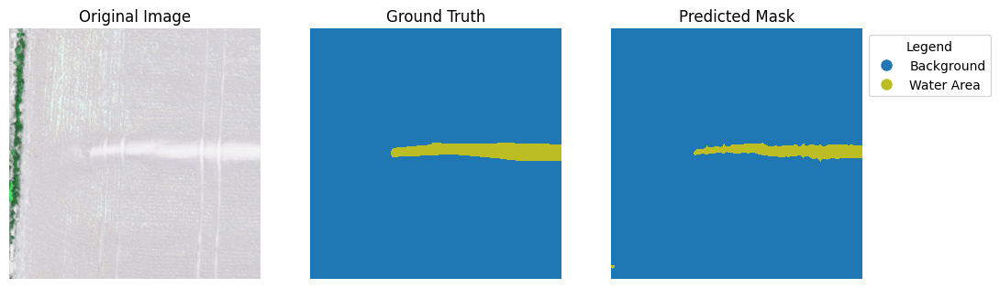

Loss: 0.06657152622938156


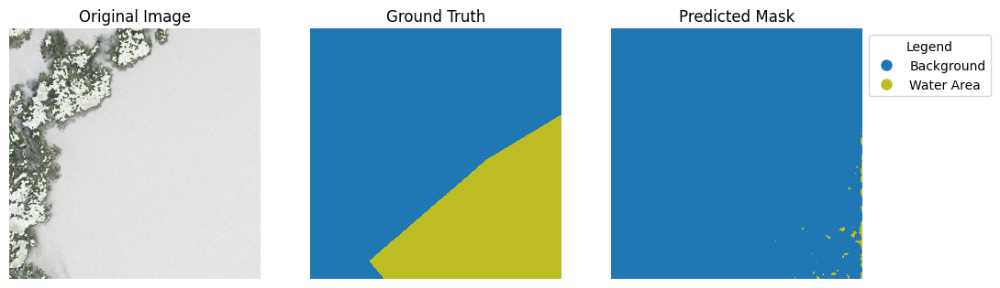

Loss: 0.4739854335784912


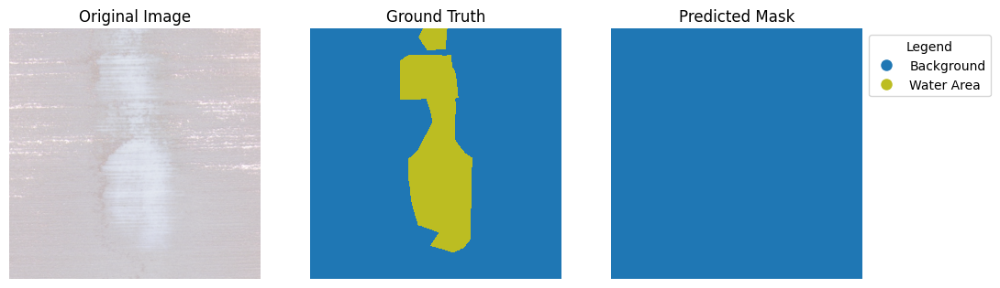

Loss: 0.3063912093639374


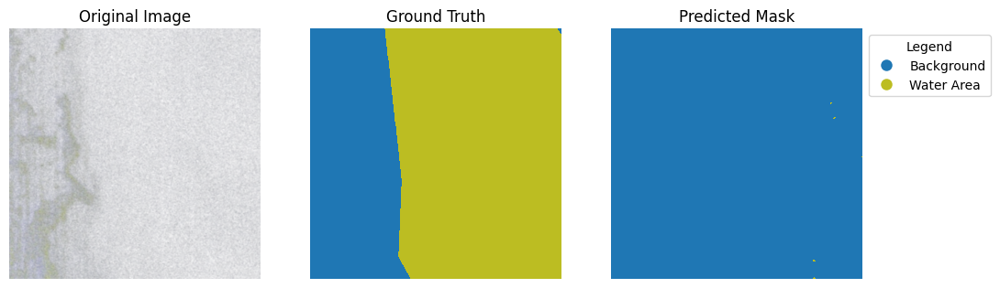

Loss: 0.6336537003517151


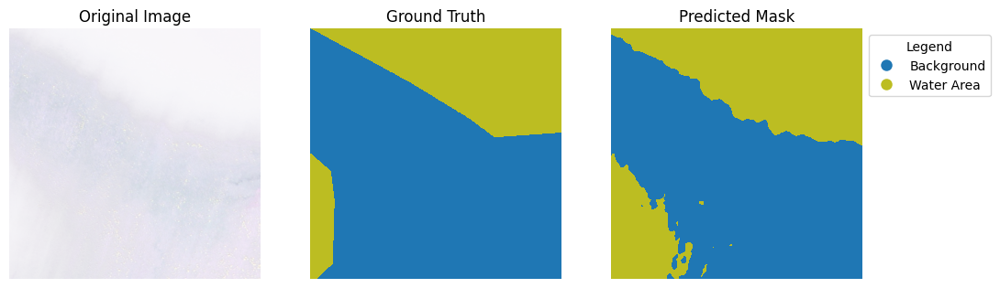

Loss: 0.5485484600067139


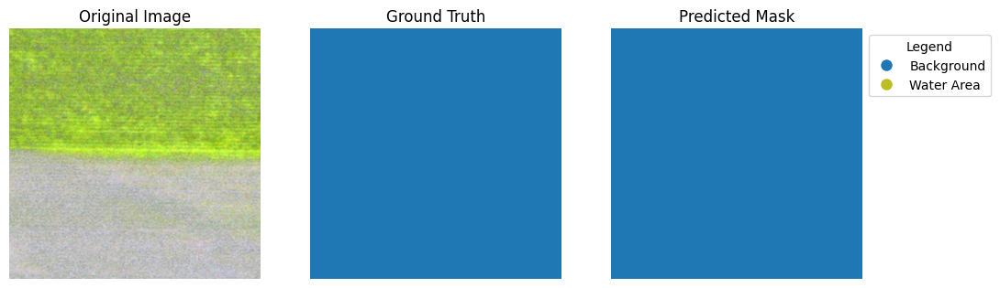

Loss: 0.00031531465356238186


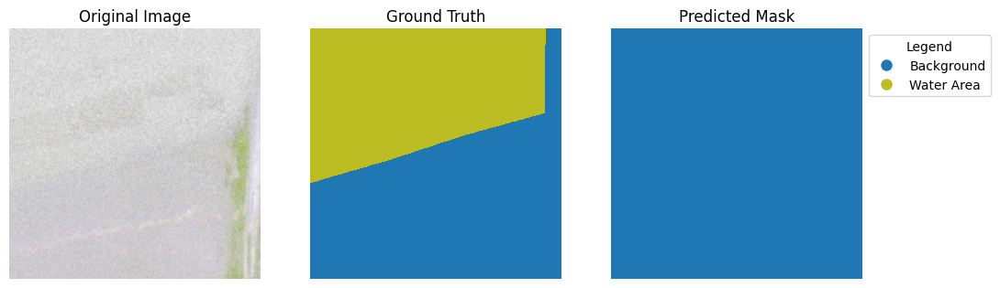

Loss: 0.788547158241272


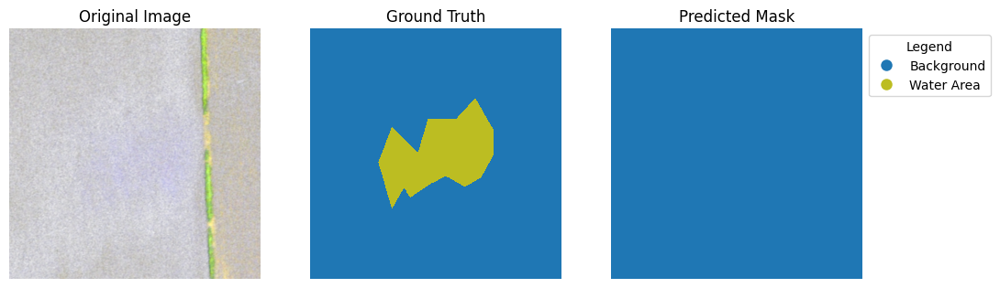

Loss: 0.3175693452358246


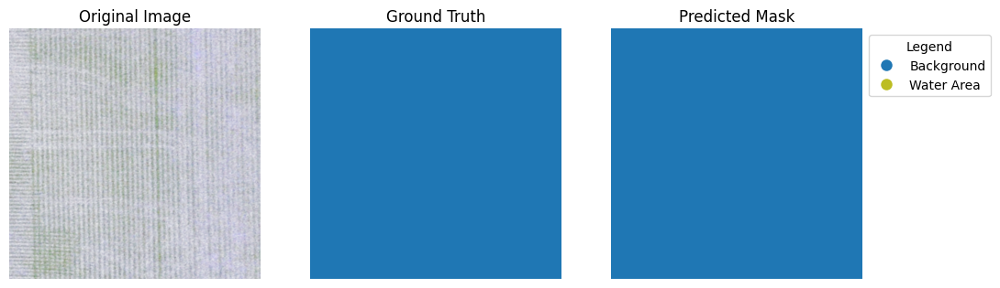

Loss: 0.02354426123201847


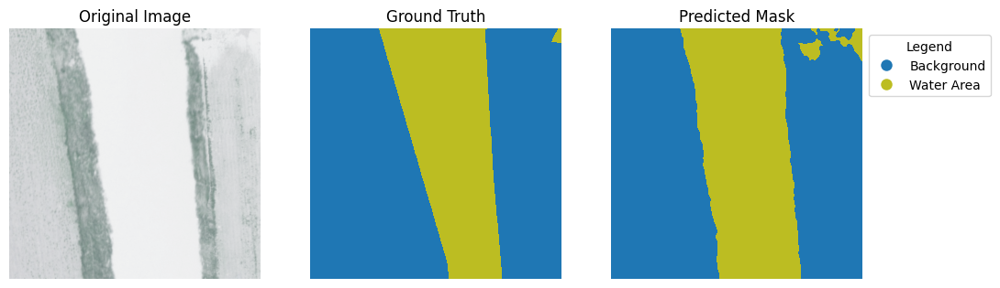

Loss: 0.3228664696216583


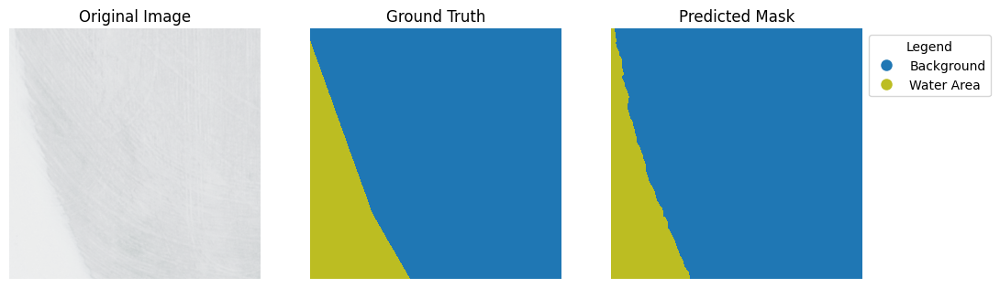

Loss: 0.5338994264602661


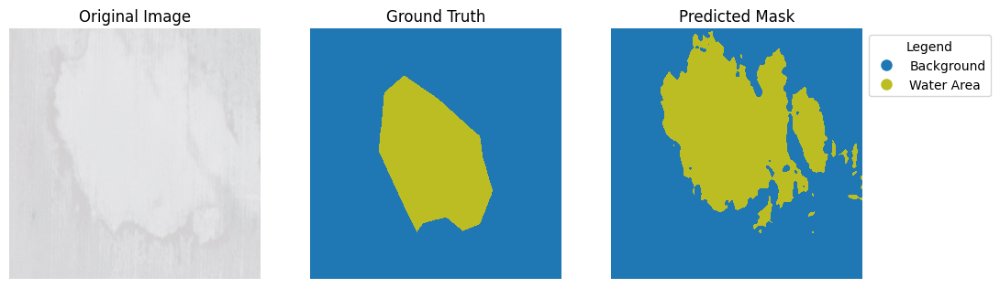

Loss: 0.4798882007598877


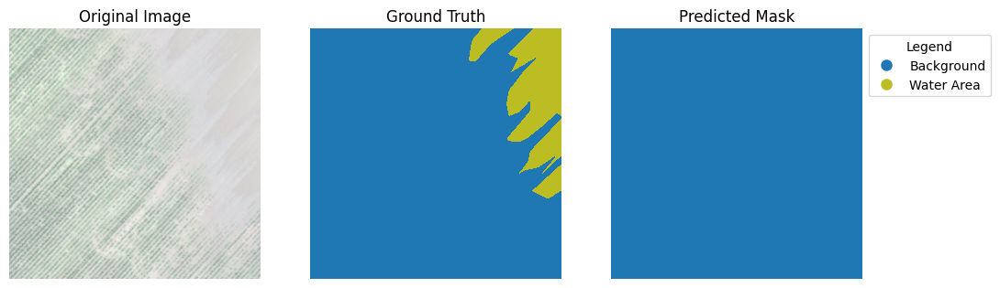

Loss: 0.2179783433675766


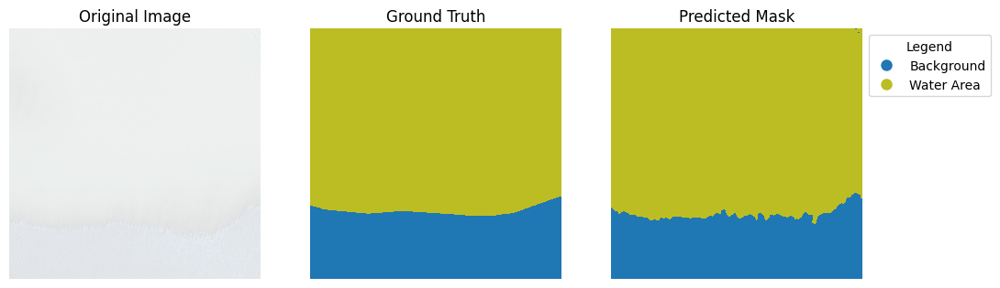

Loss: 0.6014605164527893


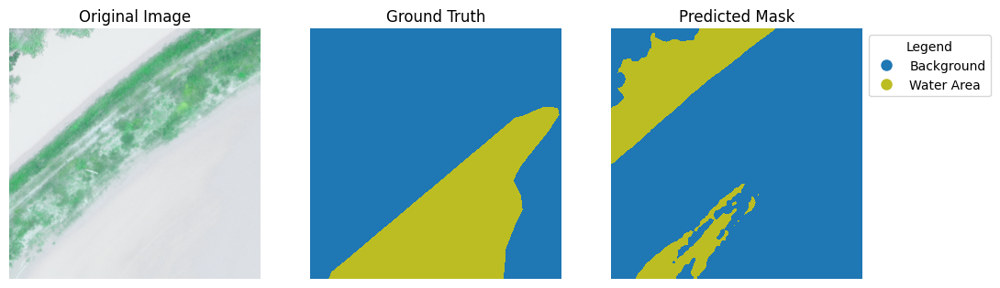

Loss: 0.396940678358078


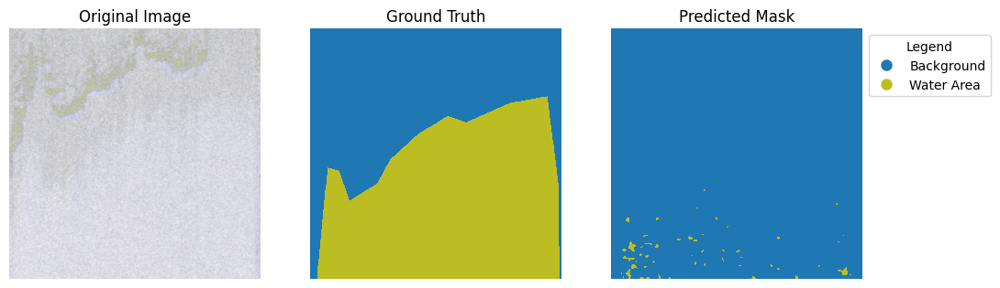

Loss: 0.504246175289154


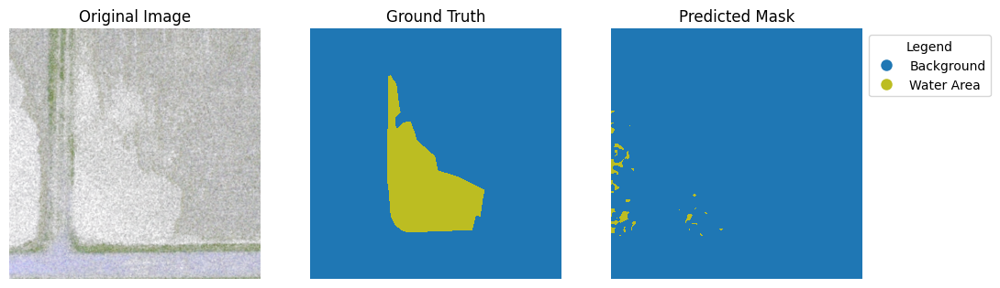

Loss: 0.2601914703845978


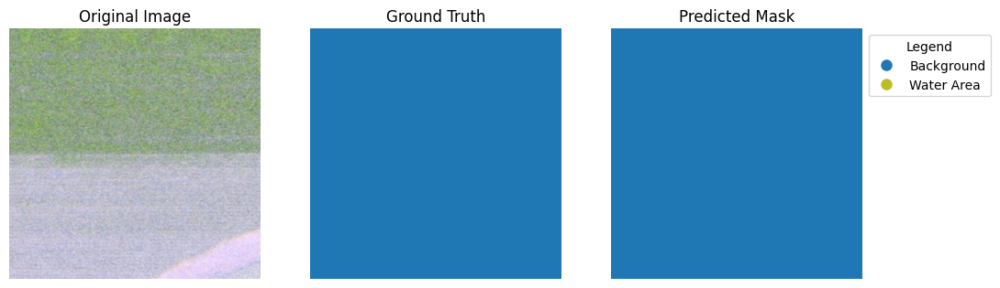

Loss: 0.004708814900368452


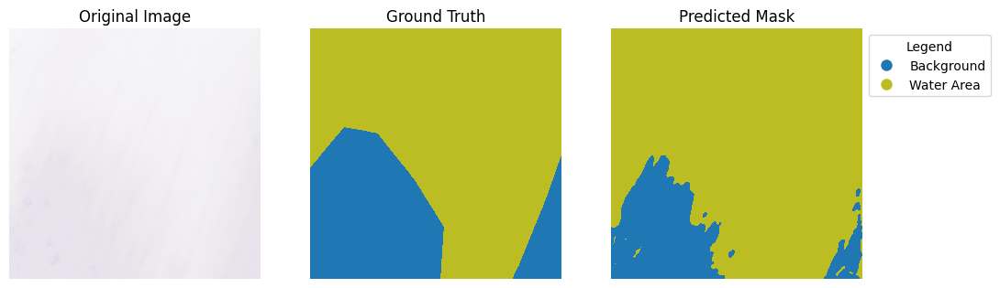

Loss: 0.613176167011261


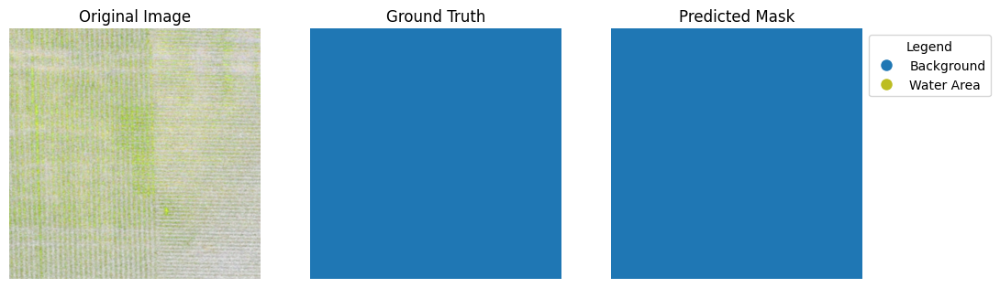

Loss: 0.0008859571535140276


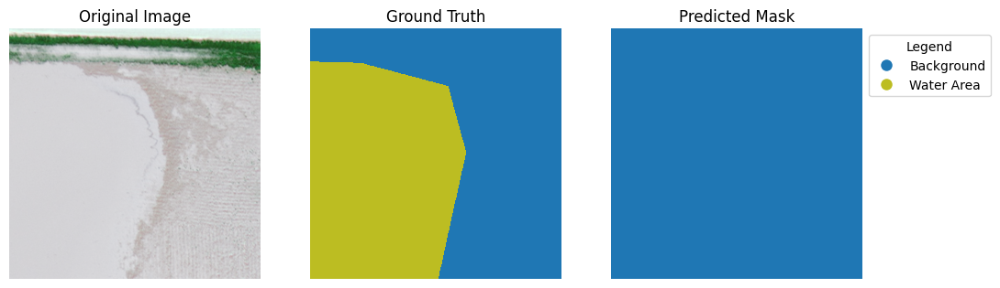

Loss: 0.9193524718284607


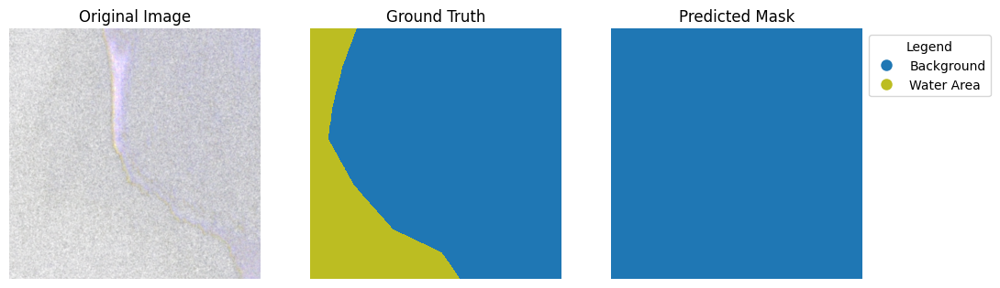

Loss: 0.3336574137210846


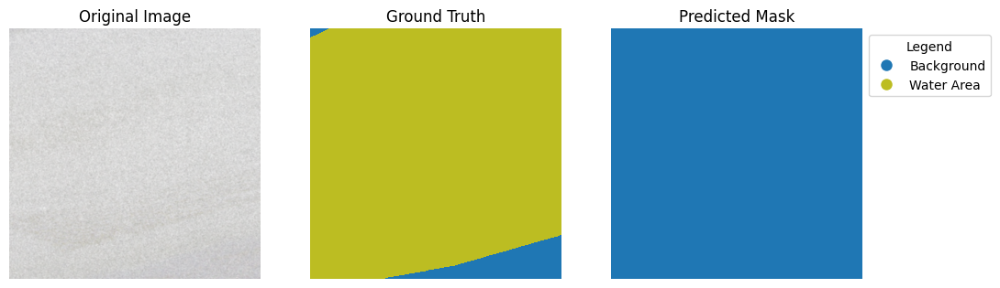

Loss: 1.7558971643447876


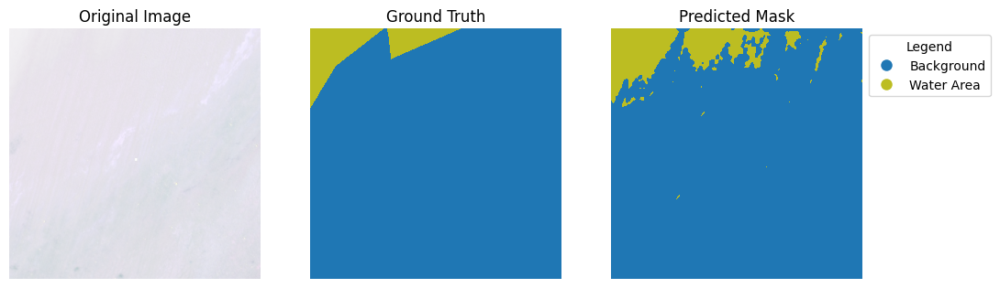

Loss: 0.6017900109291077


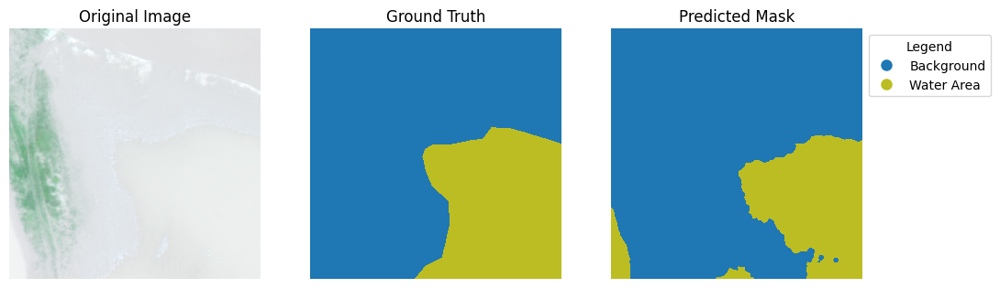

Loss: 0.44799867272377014


KeyboardInterrupt: 

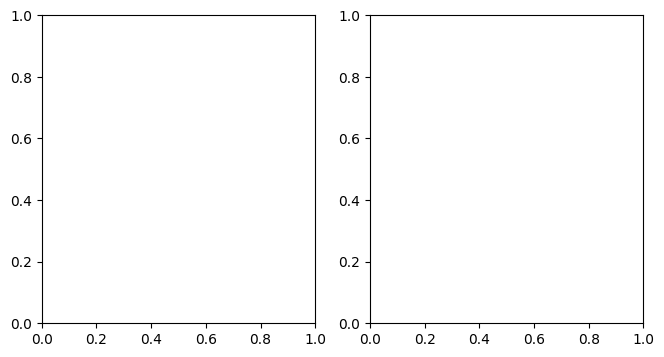

In [19]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F

model.eval()
preds = []
gts = []
test_loader = DataLoader(test_water_dataset, batch_size=1, shuffle=True)
model.cpu()
with torch.no_grad():
    for data in test_loader:
        inputs, labels = data
        gts.append(labels)
        outputs = model(inputs)
        labels = labels.long()
        # Convert output to probabilities and get the predicted class
        _, predicted = torch.max(outputs, 1)

        # Display the original image, ground truth, and predicted segmentation mask
        fig, axes = plt.subplots(1, 3, figsize=(12, 4))

        # Original image
        axes[0].imshow(F.to_pil_image(inputs[0]))  # Assuming batch_size=1
        axes[0].set_title('Original Image')
        config_plot(axes[0])
        
        # Ground truth label
        axes[1].imshow(labels[0].squeeze(0), cmap=custom_cmap, vmin=0, vmax=9)  # Assuming single-channel labels
        axes[1].set_title('Ground Truth')
        config_plot(axes[1])
        
        # Predicted segmentation mask
        axes[2].imshow(predicted[0].squeeze(0), cmap=custom_cmap, vmin=0, vmax=9)  # Adjust cmap as needed
        axes[2].set_title('Predicted Mask')

        preds.append(predicted)

        legend_labels = ['Background', 'Water Area']
        plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                    for color, label in zip(custom_colors, legend_labels)],
        title='Legend', loc='upper left', bbox_to_anchor=(1, 1))
        
        config_plot(axes[2])
        plt.show()
        print("Loss:" , criterion(outputs, labels.squeeze(1)).item())
